In [159]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px

# Import the labelled data

In [160]:
df_labelled = pd.read_csv('./../../Data_phone/unsup_labelled_data.csv')
df_labelled.drop(columns=['0','1','2','3','4','5'],axis=1,inplace=True)
df_labelled.columns = ['label','lat','lon']
df_labelled

,label,lat,lon
0,1.0,46.899810,16.857534
1,1.0,46.899785,16.857527
2,1.0,46.899758,16.857519
3,1.0,46.899730,16.857511
4,1.0,46.899703,16.857503
...,...,...,...
2562,3.0,46.825737,16.829406
2563,3.0,46.825791,16.829311
2564,3.0,46.825845,16.829305
2565,3.0,46.825878,16.829328


In [161]:
fig = px.scatter_mapbox(lat=df_labelled['lat'], lon=df_labelled['lon'], color= df_labelled['label'],  zoom=10, width=500, height=500, color_continuous_scale=px.colors.diverging.RdYlGn) #px.colors.diverging.RdYlGn) #, hover_name="City", hover_data=["State", "Population"], color_discrete_sequence=["fuchsia"], zoom=3, height=300)
#, text=df_raw.index,
#fig.update_geos(scope='europe')
fig.update_geos(fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox=dict(
    style="light", 
    accesstoken='pk.eyJ1Ijoicm9sYW5kbmFneSIsImEiOiJjbHRrZXptcWMweTJtMmlzNG40YjNmY3ozIn0.66tCRA-MiLLA-xAKcPiPlw',
    pitch=0,
    zoom=5
    )
)

# Import the raw data

In [162]:
acc = pd.read_csv('./../../Data_phone/pali-otthon/Accelerometer.csv',sep=',',header=0,names=['time','seconds_elapsed','acc_z','acc_y','acc_x'])
gyr = pd.read_csv('./../../Data_phone/pali-otthon/Gyroscope.csv',sep=',',header=0,names=['time','seconds_elapsed','gyr_z','gyr_y','gyr_x'])
#mag = pd.read_csv('./../../Data_phone/pali-otthon/Magnetometer.csv',sep=',',header=0,names=['time','seconds_elapsed','mag_z','mag_y','mag_x'])
loc = pd.read_csv('./../../Data_phone/pali-otthon/Location.csv',sep=',')

df_raw = pd.concat([acc, gyr[['gyr_z','gyr_y','gyr_x']]], axis=1) #Concat the vibration data """, mag[['mag_z','mag_y','mag_x']]"""

In [163]:
df_raw

,time,seconds_elapsed,acc_z,acc_y,acc_x,gyr_z,gyr_y,gyr_x
0,1709479874816941300,0.030941,0.003924,-0.323628,-0.246644,-0.013459,0.080146,-0.007117
1,1709479874826998300,0.040998,-0.285720,0.284784,-0.068226,-0.023030,0.055037,0.004746
2,1709479874837056500,0.051056,0.692226,-0.024066,-0.644851,-0.013440,0.075295,-0.001381
3,1709479874847114200,0.061114,-0.363028,-0.022247,-0.183344,-0.014847,0.065443,0.003200
4,1709479874857171200,0.071171,0.338663,0.214720,0.074267,-0.026248,0.010992,0.013625
...,...,...,...,...,...,...,...,...
78372,1709480663057729800,788.271730,0.743757,-0.042798,-0.097928,0.002066,0.013584,0.002032
78373,1709480663067787500,788.281788,-0.175027,-0.110445,-0.092372,0.001618,-0.008476,-0.003821
78374,1709480663077845800,788.291846,-0.515652,-0.181124,0.146052,0.000175,-0.020374,-0.014289
78375,1709480663087903700,788.301904,0.538012,-0.055677,0.056292,0.000252,0.003068,-0.007953


# Preprocessing

### Interpolate GPS data

In [164]:
loc_new = pd.DataFrame()
fp = loc['seconds_elapsed'] #interpolaciohoz: ismert adatpontok helye
x = df_raw['seconds_elapsed'] #interpolaciohoz: uj adatpontok helye

for j in ['latitude','longitude','speed']:
    xp = loc[j] #interpolaciohoz: eredeti y ertekek
    loc_new[j] = np.interp(x, fp, xp) 
    
df_raw = pd.concat([df_raw, loc_new], axis=1)
df_raw.rename(columns={"latitude":"lat", "longitude": "lon"}, inplace=True)

df_raw.head()

,time,seconds_elapsed,acc_z,acc_y,acc_x,gyr_z,gyr_y,gyr_x,lat,lon,speed
0,1709479874816941300,0.030941,0.003924,-0.323628,-0.246644,-0.013459,0.080146,-0.007117,46.899863,16.857550,18.467588
1,1709479874826998300,0.040998,-0.285720,0.284784,-0.068226,-0.023030,0.055037,0.004746,46.899862,16.857549,18.467573
2,1709479874837056500,0.051056,0.692226,-0.024066,-0.644851,-0.013440,0.075295,-0.001381,46.899860,16.857549,18.467558
3,1709479874847114200,0.061114,-0.363028,-0.022247,-0.183344,-0.014847,0.065443,0.003200,46.899858,16.857548,18.467544
4,1709479874857171200,0.071171,0.338663,0.214720,0.074267,-0.026248,0.010992,0.013625,46.899856,16.857548,18.467529


### Trajectory smoothing

In [165]:
def moving_average(x, N=100):
    padded = np.pad(x, (N//2, N-1-N//2), mode='edge')
    return np.convolve(padded, np.ones((N,))/N, mode='valid')

In [166]:
df_raw['lon'] = moving_average(df_raw['lon'].copy().to_numpy())
df_raw['lat'] = moving_average(df_raw['lat'].copy().to_numpy())

### Spatial resampling

In [167]:
dDist = []
for j in np.arange(2,len(df_raw)):
    d = abs(np.arccos(np.cos(np.deg2rad(90-df_raw['lat'].loc[j-1])) * np.cos(np.deg2rad(90-df_raw['lat'].loc[j])) + np.sin(np.deg2rad(90-df_raw['lat'].loc[j-1])) * np.sin(np.deg2rad(90-df_raw['lat'].loc[j]))) * np.cos(np.deg2rad(df_raw['lon'].loc[j-1]-df_raw['lon'].loc[j])) * 3958.76);
    dDist.append(d)
df_raw_dDist = pd.DataFrame(dDist)
df_raw_dDist.fillna(0,inplace=True) #remove the NaN values, introduced from the above calculation
df_raw_dDist.isna().value_counts()

df_raw_dDist[0].replace(0, 0.000001, inplace=True) #correct the count error

/var/folders/w_/802pn39d4f75d8__y1zs9yxm0000gn/T/ipykernel_80027/3041659135.py:3: RuntimeWarning:

invalid value encountered in arccos

/var/folders/w_/802pn39d4f75d8__y1zs9yxm0000gn/T/ipykernel_80027/3041659135.py:9: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [168]:
fs = 5

summed = np.cumsum(df_raw_dDist.to_numpy())*2200   #calculated the total travelled distance by cumsum function
uniqe_indexes = np.unique(summed,return_index=True)
x = np.arange(0,max(summed),1/fs)

# Then we use again the interp function to convert the time domain to the spatial domain
df_raw_spatial = pd.DataFrame()
for j in ['acc_z','acc_y','acc_x','gyr_z','gyr_y','gyr_x','lat','lon','speed','time','seconds_elapsed']:
    xp = df_raw[j]
    df_raw_spatial[j] = np.interp(x,uniqe_indexes[0],xp[uniqe_indexes[1]])

In [169]:
from scipy.interpolate import CubicSpline

In [170]:
df_raw_spatial_spline = pd.DataFrame()
for j in ['acc_z','acc_y','acc_x','gyr_z','gyr_y','gyr_x','lat','lon','speed','time','seconds_elapsed']:
    xp = df_raw[j][:-2]
    cs = CubicSpline(summed,xp)
    df_raw_spatial_spline[j] = cs(x)

### Normalization

In [171]:
from sklearn.preprocessing import normalize

In [172]:
df_raw_normalized = pd.DataFrame(normalize(df_raw_spatial[['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x']], norm='max', axis=0))
df_raw_normalized.columns = ['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x']

df_raw_normalized['lat'] = df_raw_spatial['lat']
df_raw_normalized['lon'] = df_raw_spatial['lon']
df_raw_normalized['speed'] = df_raw_spatial['speed']
df_raw_normalized['time'] = df_raw_spatial['time']
df_raw_normalized['seconds_elapsed'] = df_raw_spatial['seconds_elapsed']

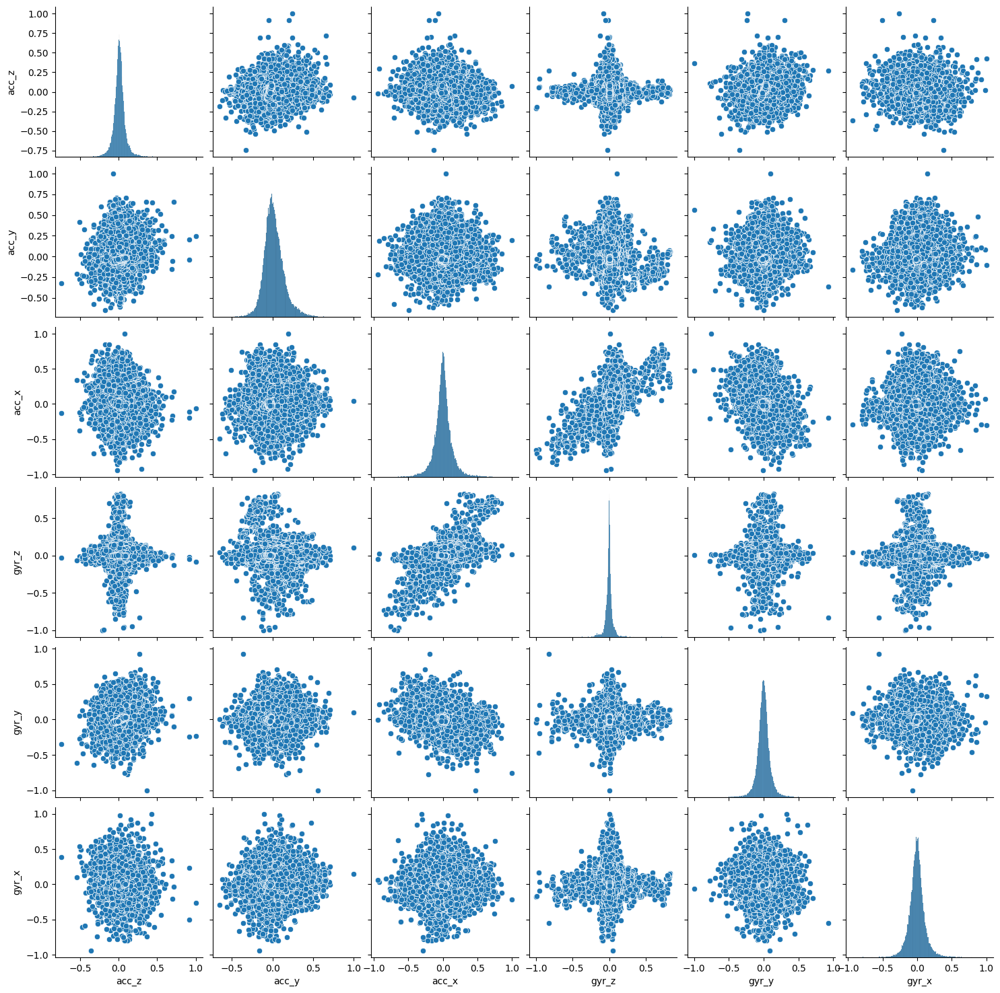

In [173]:
sns.pairplot(data=df_raw_normalized[['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x']])

# Feature extraction

## Spectrogram

In [174]:
from scipy import signal

In [175]:
import matplotlib.scale as scl
scl.get_scale_names()

['asinh', 'function', 'functionlog', 'linear', 'log', 'logit', 'symlog']

In [176]:
# Sum the Y axis

df_raw_sum_spectrum = pd.DataFrame()
for var in ['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z']:
    f, t, Sxx = signal.spectrogram(df_raw_normalized[var], 5, nperseg=50, noverlap=30) # here I use 5 Hz for fs    ### or nperseg=100 ???
    new_row = np.sum(Sxx, axis=0)
    df_raw_sum_spectrum = pd.concat([df_raw_sum_spectrum, pd.DataFrame([new_row]).T], ignore_index=True, axis=1)

df_raw_sum_spectrum.columns = ['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z']

In [177]:
# Interpolate the GPS data to fit for the spectrum data size

for j in ['lat','lon']:
    xp = df_raw[j][:-2]
    cs = CubicSpline(summed,xp)
    df_raw_sum_spectrum[j] = cs(t)

## Aggressive manouver

### Detection

In [178]:
from scipy.signal import find_peaks

In [180]:
# Aggressive maneuver are represented by the acc_x and the gyr_z variables
    # See the above correlation map
    # And the sensor orientation
    
df_raw_sum_spectrum[['acc_x','gyr_z']].describe()

,acc_x,gyr_z
count,2577.000000,2577.000000
mean,0.076969,0.008767
std,0.104833,0.064614
min,0.001898,0.000072
25%,0.021333,0.000394
50%,0.043506,0.000765
75%,0.088197,0.002069
max,1.997212,1.109905


In [181]:
print(np.percentile(df_raw_sum_spectrum['acc_x'], 99))
print(np.percentile(df_raw_sum_spectrum['gyr_z'], 99))

0.50572346976129
0.18841696961125773


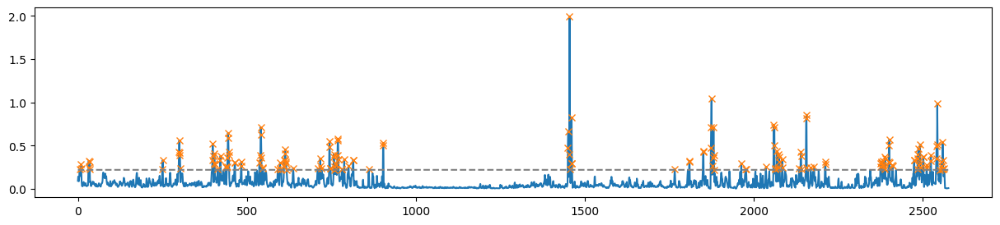

In [179]:
# Find aggressive turnings in acc_x
#peaks_accx, _ = find_peaks(df_raw_sum_spectrum['acc_x'], height=0.22)
peaks_accx = df_raw_sum_spectrum[df_raw_sum_spectrum['acc_x'] > 0.22].index

plt.figure(figsize=(15,3))
plt.plot(df_raw_sum_spectrum['acc_x'])
plt.plot(peaks_accx, df_raw_sum_spectrum['acc_x'][peaks_accx], "x")
plt.plot(np.zeros_like(df_raw_sum_spectrum['acc_x'])+0.22, "--", color="gray")
plt.show()

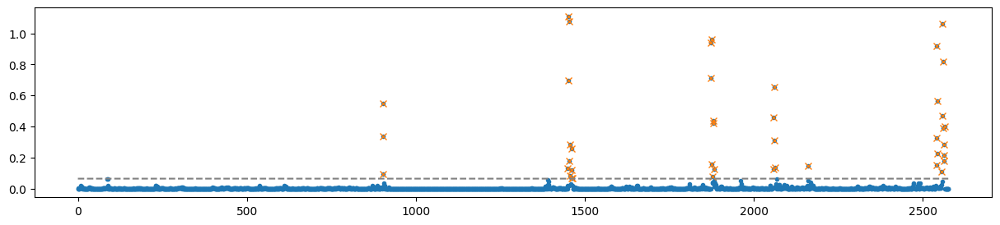

In [182]:
# Find aggressive turnings in gyr_z

#peaks_gyrz, _ = find_peaks(df_raw_sum_spectrum['gyr_z'], height = np.std(df_raw_sum_spectrum['gyr_z']), distance=1)
peaks_gyrz = df_raw_sum_spectrum[df_raw_sum_spectrum['gyr_z'] > np.std(df_raw_sum_spectrum['gyr_z'])].index

plt.figure(figsize=(15,3))
plt.plot(df_raw_sum_spectrum['gyr_z'],'.')
plt.plot(peaks_gyrz, df_raw_sum_spectrum['gyr_z'][peaks_gyrz], "x")
plt.plot(np.zeros_like(df_raw_sum_spectrum['gyr_z']) + np.std(df_raw_sum_spectrum['gyr_z']), "--", color="gray")
plt.show()

In [183]:
peaks = pd.concat([pd.DataFrame(peaks_accx), pd.DataFrame(peaks_gyrz)], join="outer", ignore_index=True).drop_duplicates()[0]  # Location indexes of aggressive turnings

### Correction

In [184]:
df_raw_sum_spectrum_corrected = df_raw_sum_spectrum.copy()

In [185]:
df_raw_sum_spectrum_corrected['acc_x'][peaks] = df_raw_sum_spectrum['acc_x'].median()

/var/folders/w_/802pn39d4f75d8__y1zs9yxm0000gn/T/ipykernel_80027/3921859547.py:1: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy




In [186]:
df_raw_sum_spectrum_corrected['gyr_z'].loc[peaks] = df_raw_sum_spectrum['gyr_z'].median()

/var/folders/w_/802pn39d4f75d8__y1zs9yxm0000gn/T/ipykernel_80027/252959852.py:1: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy




## Normalization

<Axes: ylabel='Frequency'>

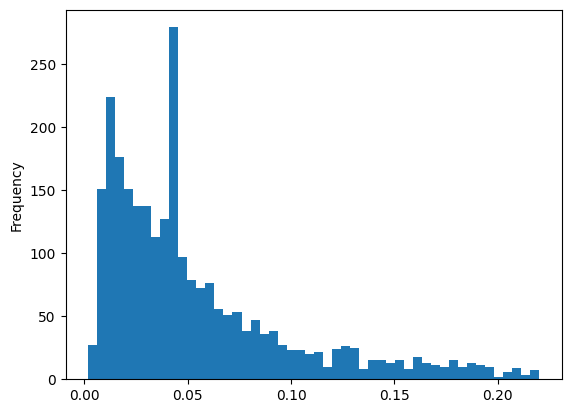

In [187]:
# skewed data, lognormal distribution

df_raw_sum_spectrum_corrected['acc_x'].plot(kind='hist', bins=50)

In [188]:
from sklearn.preprocessing import MinMaxScaler

In [189]:
scaler = MinMaxScaler(feature_range=(0.0000000001,1))
df_raw_scaled = scaler.fit_transform(df_raw_sum_spectrum_corrected[['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z']])

In [190]:
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer(method='box-cox', standardize=False)
df_raw_rescaled = pt.fit_transform(df_raw_scaled)
# https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.PowerTransformer.html#sklearn.preprocessing.PowerTransformer
# https://scikit-learn.org/stable/modules/preprocessing.html

### Remove outliers

In [191]:
df_raw_outliers_removed = pd.DataFrame(df_raw_rescaled).copy()
for vars in df_raw_outliers_removed:
    df_raw_outliers_removed[vars][df_raw_outliers_removed[vars] > (df_raw_outliers_removed[vars].mean() + df_raw_outliers_removed[vars].std()*3.5)] = (df_raw_outliers_removed[vars].mean() + df_raw_outliers_removed[vars].std()*3.5)
    df_raw_outliers_removed[vars][df_raw_outliers_removed[vars] < (df_raw_outliers_removed[vars].mean() - df_raw_outliers_removed[vars].std()*3.5)] = (df_raw_outliers_removed[vars].mean() - df_raw_outliers_removed[vars].std()*3.5)

/var/folders/w_/802pn39d4f75d8__y1zs9yxm0000gn/T/ipykernel_80027/1490591668.py:3: FutureWarning:

ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


/var/folders/w_/802pn39d4f75d8__y1zs9yxm0000gn/T/ipykernel_80027/1490591668.py:4: FutureWarning:

ChainedAssignme

## Segmentation

In [192]:
import ruptures as rpt

In [193]:
# detection with https://centre-borelli.github.io/ruptures-docs/code-reference/detection/pelt-reference/ 

#algo = rpt.Dynp(model="l2").fit(df_raw_outliers_removed[0].to_numpy())
#result = algo.predict(n_bkps=40)

algo = rpt.Pelt().fit(df_raw_outliers_removed[2].to_numpy())
result = algo.predict(1) #original pen=1
result[:5]

[10, 20, 30, 35, 75]

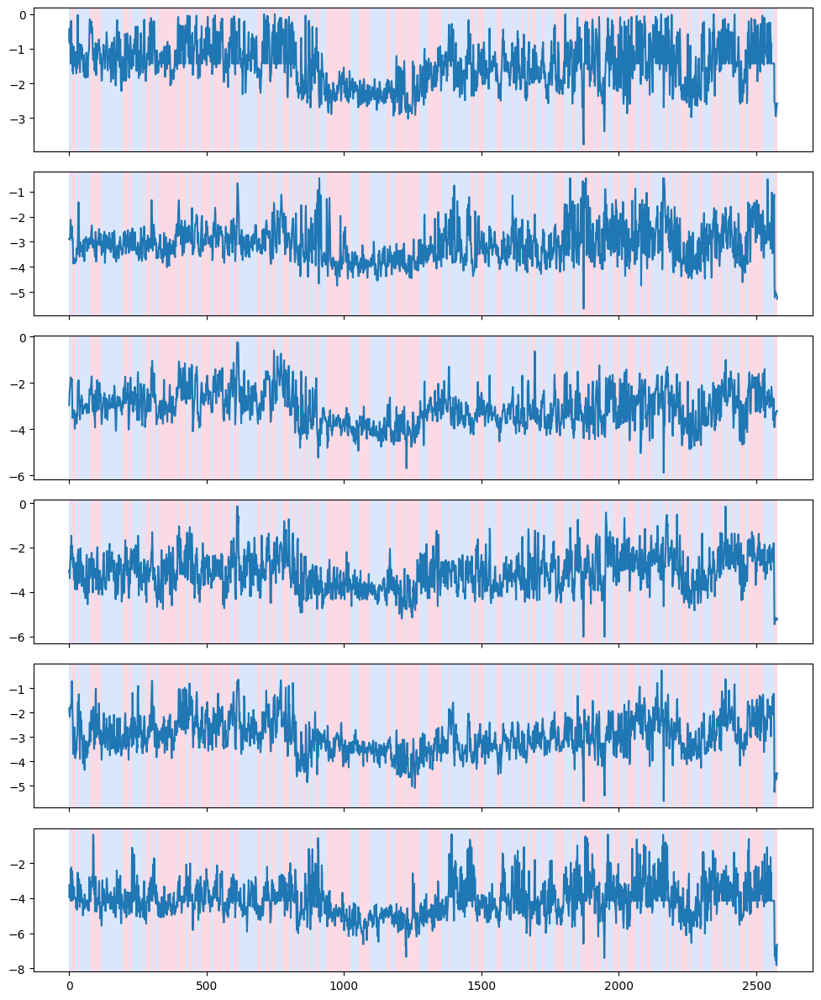

In [194]:
# display segmentation
rpt.display(df_raw_outliers_removed.to_numpy(), result)
plt.show()

In [195]:
from scipy import stats

def calculate_std_vector(df_raw, breakpoints): #std
    vector = np.zeros(len(df_raw))
    for i in range(len(breakpoints) - 1):
        start = breakpoints[i]
        end = breakpoints[i + 1]
        segment = df_raw.iloc[start:end]
        value = segment.std()
        vector[start:end] = value
    return vector

def calculate_median_vector(df_raw, breakpoints): #median
    vector = np.zeros(len(df_raw))
    for i in range(len(breakpoints) - 1):
        start = breakpoints[i]
        end = breakpoints[i + 1]
        segment = df_raw.iloc[start:end]
        value = segment.median()
        vector[start:end] = value
    return vector

In [196]:
df_raw_outliers_removed.columns = ['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z']

In [197]:
# Calculate std and median features for all variables, as these features were the most representative of the information content 

df_raw_features = pd.DataFrame()
for i in ['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z']:
    df_raw_features['std_' + i] = calculate_std_vector(df_raw_outliers_removed[i], result)
    df_raw_features['median_' + i] = calculate_median_vector(df_raw_outliers_removed[i], result)
df_raw_features = df_raw_features.iloc[10:]

In [203]:
df_raw_features = df_raw_features[['std_acc_x', 'std_acc_y', 'std_acc_z', 'std_gyr_x', 'std_gyr_y', 'std_gyr_z', 'median_acc_x',  'median_acc_y', 'median_acc_z', 'median_gyr_x', 'median_gyr_y', 'median_gyr_z']]

In [202]:
df_raw_features.columns

Index(['std_acc_x', 'median_acc_x', 'std_acc_y', 'median_acc_y', 'std_acc_z',
       'median_acc_z', 'std_gyr_x', 'median_gyr_x', 'std_gyr_y',
       'median_gyr_y', 'std_gyr_z', 'median_gyr_z'],
      dtype='object')

<Axes: >

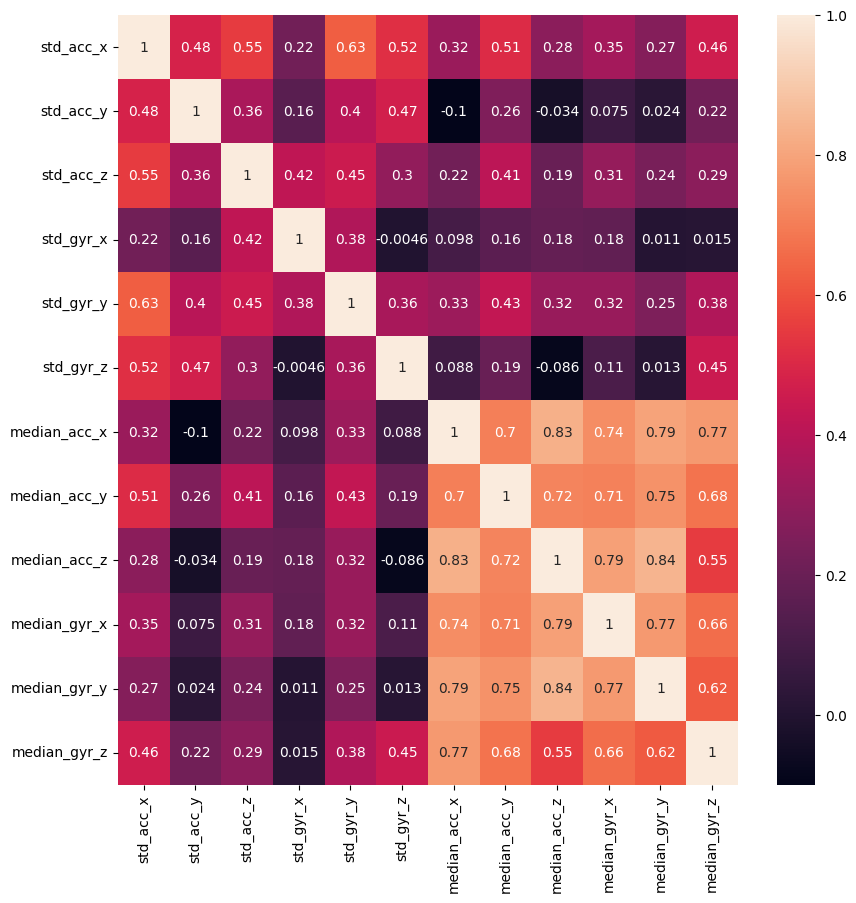

In [206]:
plt.figure(figsize=(10,10))
sns.heatmap(df_raw_features.corr(), annot=True)

<Axes: >

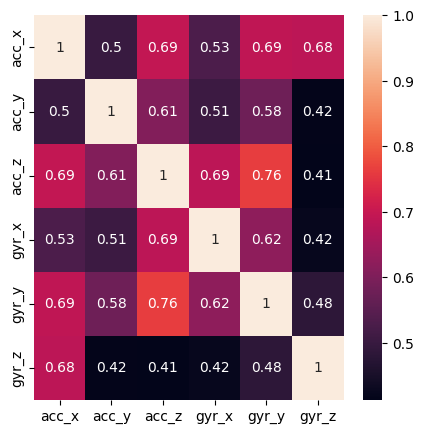

In [208]:
plt.figure(figsize=(5,5))
sns.heatmap(df_raw_outliers_removed.corr(), annot=True)

# Supervised learning

In [48]:
df_labelled

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,label,lat,lon
0,-0.808215,-2.889630,-2.962062,-3.074866,-1.833481,-3.943853,1.0,46.899810,16.857534
1,-0.421574,-2.919744,-2.448752,-3.013280,-2.080526,-3.226437,1.0,46.899785,16.857527
2,-0.822473,-2.866442,-2.285423,-3.388568,-2.178895,-3.524656,1.0,46.899758,16.857519
3,-0.852434,-2.845809,-2.217998,-2.860346,-1.966153,-3.948496,1.0,46.899730,16.857511
4,-0.381813,-2.573143,-1.990025,-2.558108,-1.782508,-3.706712,1.0,46.899703,16.857503
...,...,...,...,...,...,...,...,...,...
2562,-1.428735,-1.754741,-3.216445,-2.561249,-1.506702,-4.142829,3.0,46.825737,16.829406
2563,-1.428735,-1.688018,-2.686162,-1.801369,-1.230126,-4.142829,3.0,46.825791,16.829311
2564,-1.428735,-1.343105,-2.901990,-2.062314,-1.885629,-4.142829,3.0,46.825845,16.829305
2565,-1.428735,-1.120325,-3.763930,-3.767383,-2.779588,-4.142829,3.0,46.825878,16.829328


In [209]:
df_raw_features

,std_acc_x,std_acc_y,std_acc_z,std_gyr_x,std_gyr_y,std_gyr_z,median_acc_x,median_acc_y,median_acc_z,median_gyr_x,median_gyr_y,median_gyr_z
10,0.310395,0.526610,0.512330,0.486218,0.963732,0.567705,-1.433575,-3.501934,-3.243056,-2.601420,-2.656786,-3.533258
11,0.310395,0.526610,0.512330,0.486218,0.963732,0.567705,-1.433575,-3.501934,-3.243056,-2.601420,-2.656786,-3.533258
12,0.310395,0.526610,0.512330,0.486218,0.963732,0.567705,-1.433575,-3.501934,-3.243056,-2.601420,-2.656786,-3.533258
13,0.310395,0.526610,0.512330,0.486218,0.963732,0.567705,-1.433575,-3.501934,-3.243056,-2.601420,-2.656786,-3.533258
14,0.310395,0.526610,0.512330,0.486218,0.963732,0.567705,-1.433575,-3.501934,-3.243056,-2.601420,-2.656786,-3.533258
...,...,...,...,...,...,...,...,...,...,...,...,...
2572,0.394968,1.164551,0.243903,0.441171,0.599709,1.007636,-2.637965,-5.098054,-3.314849,-5.232912,-4.591013,-6.935956
2573,0.394968,1.164551,0.243903,0.441171,0.599709,1.007636,-2.637965,-5.098054,-3.314849,-5.232912,-4.591013,-6.935956
2574,0.394968,1.164551,0.243903,0.441171,0.599709,1.007636,-2.637965,-5.098054,-3.314849,-5.232912,-4.591013,-6.935956
2575,0.394968,1.164551,0.243903,0.441171,0.599709,1.007636,-2.637965,-5.098054,-3.314849,-5.232912,-4.591013,-6.935956


In [ ]:
ml = pd.concat([df_raw_features, df_labelled['label', 'lat', 'lon']])

In [ ]:
ml = final.drop_duplicates(subset=6)


X = ml[[6,7,8,9]]
y = ml[10]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [140]:
print(len(df_labelled))
print(len(df_raw_normalized))

2567
51317


In [114]:
# interpolate labelled data

from scipy.interpolate import griddata

In [152]:
# Extract the latitude, longitude, and label data from the labelled dataframe
labelled_points = df_labelled[['lat', 'lon']].values
labels = df_labelled['label'].values

# Extract the latitude and longitude data from the raw normalized dataframe
raw_points = df_raw_normalized[['lat', 'lon']].values

# Perform the interpolation using griddata
interpolated_labels = griddata(
    points=labelled_points, 
    values=labels, 
    xi=raw_points, 
    method='linear'
)

# If there are any NaN values resulting from interpolation, fill them
# For example, we can use nearest interpolation for those points
if np.any(np.isnan(interpolated_labels)):
    interpolated_labels = griddata(
        points=labelled_points, 
        values=labels, 
        xi=raw_points, 
        method='nearest'
    )

In [153]:
len(interpolated_labels)

51317

In [157]:
df_raw_features = pd.concat([df_raw_normalized, pd.Series(interpolated_labels)], axis=1)

In [158]:
df_raw_features

,std_acc_x,median_acc_x,std_acc_y,median_acc_y,std_acc_z,median_acc_z,std_gyr_x,median_gyr_x,std_gyr_y,median_gyr_y,std_gyr_z,median_gyr_z,lat,lon,0
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46.899842,16.857543,1.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46.899842,16.857543,1.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46.899841,16.857543,1.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46.899840,16.857543,1.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46.899839,16.857542,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
39000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
39001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
39002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0


In [ ]:
df_raw_features.drop_duplicates()

In [63]:
fig = px.scatter_mapbox(lat=df_raw_normalized['lat'], lon=df_raw_normalized['lon'], color = interpolated_labels, zoom=10, width=500, height=500 , color_continuous_scale=px.colors.diverging.RdYlGn)
#fig.update_geos(scope='europe')
fig.update_geos(fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox=dict(
    style="light", 
    accesstoken='pk.eyJ1Ijoicm9sYW5kbmFneSIsImEiOiJjbHRrZXptcWMweTJtMmlzNG40YjNmY3ozIn0.66tCRA-MiLLA-xAKcPiPlw',
    pitch=0,
    zoom=5
    )
)

fig.show()

In [56]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score, ConfusionMatrixDisplay, roc_auc_score

In [117]:
#X = pd.get_dummies(df_raw.drop(['lat', 'lon', 'speed', 'time', 'seconds_elapsed', 'label', 'dominant_value', 'coordinates', 'location', 'pca_0', 'pca_1'],axis=1),drop_first=True)
X = df_raw_normalized[['std_acc_z', 'std_gyr_x']]# df_raw_normalized[['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x']]
y = interpolated_labels

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

### Gradient Boosting

In [66]:
model = GradientBoostingClassifier(n_estimators=1000)

In [118]:
#model.fit(X_train[['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x']],y_train)
model.fit(X_train,y_train)

ValueError: Input X contains NaN.
GradientBoostingClassifier does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values

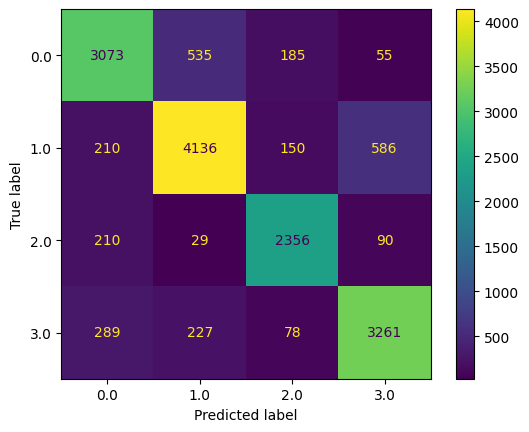

In [68]:
#preds = model.predict(X_test[['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x']])

preds = model.predict(X_test)

cm = confusion_matrix(y_test, preds, labels=model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()

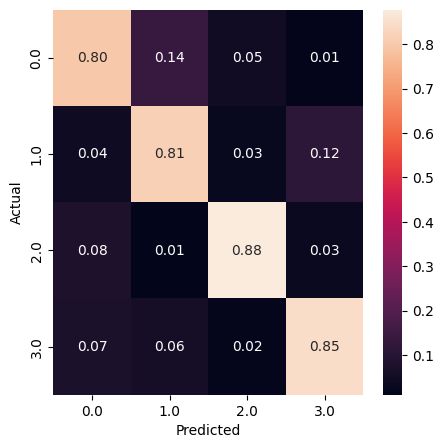

In [73]:
# Normalise
cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
fig, ax = plt.subplots(figsize=(5,5))
sns.heatmap(cmn, annot=True, fmt='.2f', xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show(block=False)

In [75]:
labels = model.predict(df_raw_features[['std_acc_z', 'std_gyr_x']])

fig = px.scatter_mapbox(lat=df_raw_normalized['lat'].iloc[10:], lon=df_raw_normalized['lon'].iloc[10:], color = labels, zoom=10, width=500, height=500 , color_continuous_scale=px.colors.diverging.RdYlGn)
#fig.update_geos(scope='europe')
fig.update_geos(fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox=dict(
    style="light", 
    accesstoken='pk.eyJ1Ijoicm9sYW5kbmFneSIsImEiOiJjbHRrZXptcWMweTJtMmlzNG40YjNmY3ozIn0.66tCRA-MiLLA-xAKcPiPlw',
    pitch=0,
    zoom=5
    )
)

fig.show()

### Random Forest

In [67]:
model = RandomForestClassifier(n_estimators=10,random_state=101)

### SVM

### KNN

# Train the model

## a) Classification model

In [58]:
# Import classification models and metrics

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import train_test_split

from sklearn.metrics import confusion_matrix,classification_report,accuracy_score, ConfusionMatrixDisplay, roc_auc_score
import shap

In [11]:
df_raw.head()

,acc_z,acc_y,acc_x,gyr_z,gyr_y,gyr_x,lat,lon,speed,time,seconds_elapsed,label,dominant_value,coordinates,location,pca_0,pca_1
0,0.396099,0.364361,0.465309,0.535791,0.639964,0.447846,46.899863,16.857550,18.467588,1.709480e+18,0.030941,2,2.0,"46.899863336758465 , 16.857549591594424","74, Egervár, Zalaegerszegi járás, Zala vármegy...",-0.012199,-0.006000
1,0.385150,0.409691,0.479529,0.530873,0.618506,0.462189,46.899862,16.857549,18.467579,1.709480e+18,0.036746,2,2.0,NaN,"74, Egervár, Zalaegerszegi járás, Zala vármegy...",0.003285,-0.015263
2,0.422354,0.403095,0.427675,0.535467,0.628807,0.462476,46.899859,16.857548,18.467554,1.709480e+18,0.053796,2,2.0,NaN,"74, Egervár, Zalaegerszegi járás, Zala vármegy...",-0.000620,0.021736
3,0.416531,0.432864,0.508472,0.524735,0.540184,0.490589,46.899856,16.857548,18.467529,1.709480e+18,0.070845,0,2.0,NaN,"74, Egervár, Zalaegerszegi járás, Zala vármegy...",0.027970,0.019117
4,0.391624,0.386718,0.471475,0.534621,0.563140,0.492585,46.899853,16.857547,18.467504,1.709480e+18,0.087895,0,2.0,NaN,"74, Egervár, Zalaegerszegi járás, Zala vármegy...",0.032759,-0.005407


In [31]:
df_raw.columns

Index(['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x', 'lat', 'lon',
       'speed', 'time', 'seconds_elapsed', 'label', 'dominant_value',
       'coordinates', 'location', 'pca_0', 'pca_1'],
      dtype='object')

In [48]:
#X = pd.get_dummies(df_raw.drop(['lat', 'lon', 'speed', 'time', 'seconds_elapsed', 'label', 'dominant_value', 'coordinates', 'location', 'pca_0', 'pca_1'],axis=1),drop_first=True)
X = df_raw[['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x','speed','pca_0', 'pca_1', 'lat', 'lon']]
y = df_raw['label']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [7]:
model = DecisionTreeClassifier()

In [43]:
model = RandomForestClassifier(n_estimators=10,random_state=101)

In [21]:
model = GradientBoostingClassifier(n_estimators=1000)

In [63]:
model.fit(X_train[['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x','speed']],y_train)

RandomForestClassifier(n_estimators=10, random_state=101)

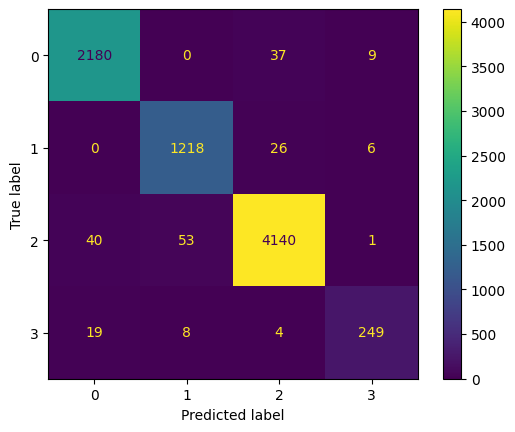

In [65]:
preds = model.predict(X_test[['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x','speed']])

cm = confusion_matrix(y_test, preds, labels=model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()

In [66]:
roc_auc_score(y, model.predict_proba(X[['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x','speed']]), multi_class='ovr')

0.9994896888237662

<BarContainer object of 7 artists>

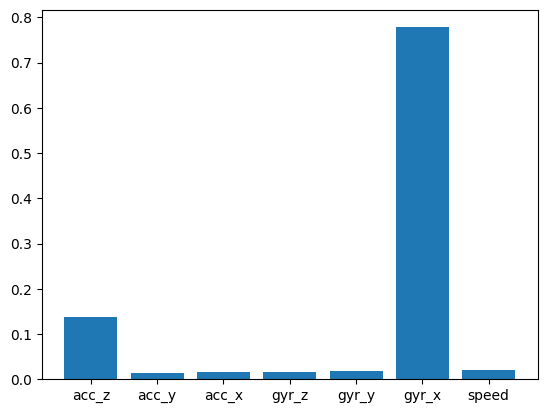

In [67]:
plt.bar(x= model.feature_names_in_, height=model.feature_importances_)

In [51]:
fig = px.scatter_mapbox(lat=X_test['lat'], lon=X_test['lon'], color = preds,  zoom=10, width=500, height=500, color_continuous_scale=px.colors.diverging.RdYlGn) #px.colors.diverging.RdYlGn) #, hover_name="City", hover_data=["State", "Population"], color_discrete_sequence=["fuchsia"], zoom=3, height=300)
#, text=df_raw.index,
#fig.update_geos(scope='europe')
fig.update_geos(fitbounds="locations")
fig.update_layout(height=300, margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox=dict(
    style="light", 
    accesstoken='pk.eyJ1Ijoicm9sYW5kbmFneSIsImEiOiJjbHRrZXptcWMweTJtMmlzNG40YjNmY3ozIn0.66tCRA-MiLLA-xAKcPiPlw',
    pitch=0,
    zoom=5
    )
)

## ...... Optimization

In [30]:
test_error = []

for n in range(1,40):
    # Use n random trees
    model = RandomForestClassifier(n_estimators=n)
    model.fit(X_train,y_train)
    test_preds = model.predict(X_test)
    test_error.append(1-accuracy_score(test_preds,y_test))

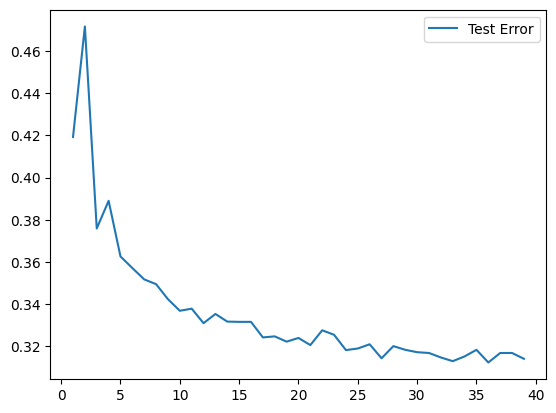

In [31]:
plt.plot(range(1,40),test_error,label='Test Error')
plt.legend()

## b) Regression model

In [68]:
from sklearn.ensemble import RandomForestRegressor

In [69]:
model = RandomForestRegressor(max_depth=5, random_state=101)
model.fit(X_train[['acc_z', 'acc_y', 'acc_x', 'gyr_z', 'gyr_y', 'gyr_x','speed']],y_train)

RandomForestRegressor(max_depth=5, random_state=101)

In [70]:
explainer = shap.Explainer(model)
shap_values = explainer.shap_values(X_test)

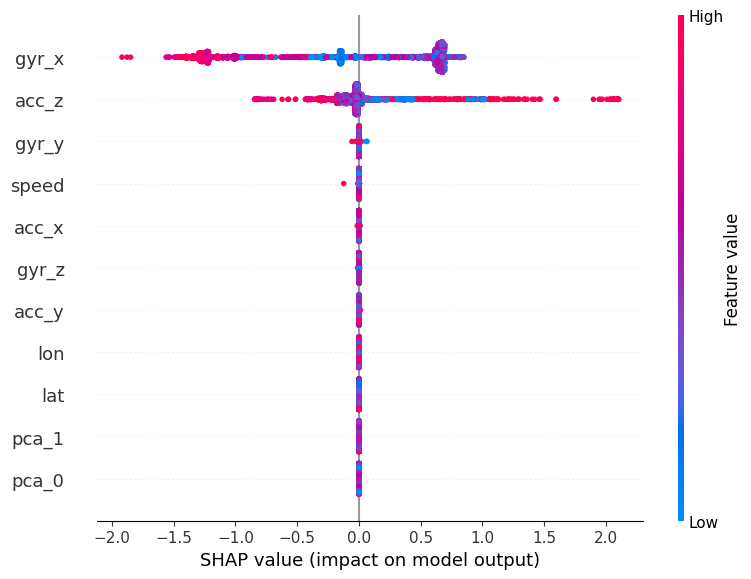

In [71]:
shap.summary_plot(shap_values, X_test, max_display=20)

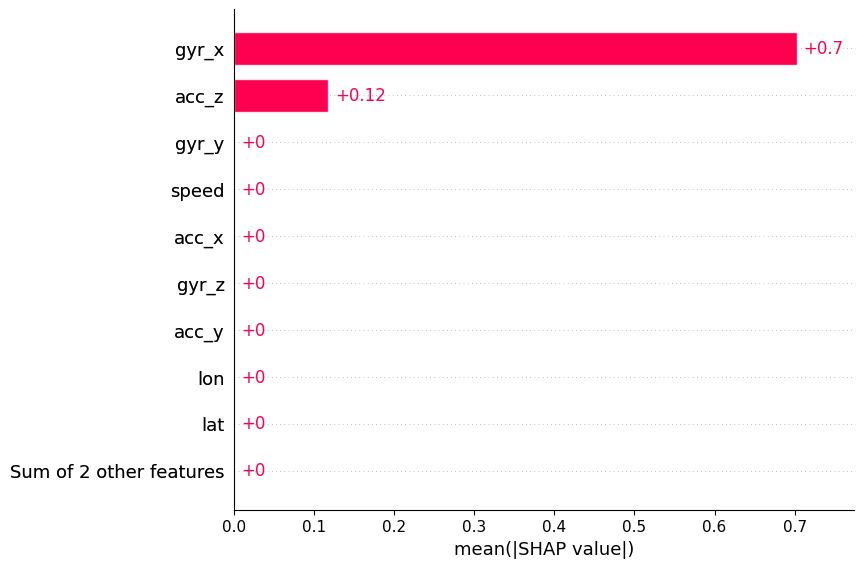

In [72]:
shap.plots.bar(explainer(X_test))